

*   GaussianBlur- removes noise

*   cv2 - image processing

*   Dilation is a morphological operation that expands the     boundaries of an object in an image


*   Erosion is a morphological operation that shrinks the boundaries of an object in an image

*   List item





In [ ]:
from PIL import Image
import cv2
import numpy as np
import requests
import io

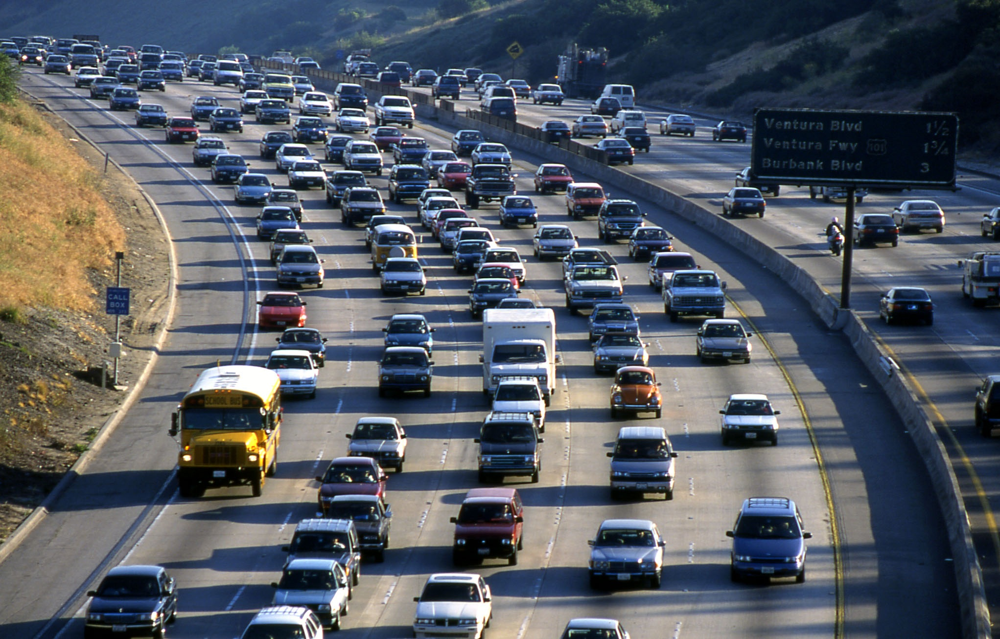

In [ ]:
image = Image.open('cars.jpg')
image.resize((450,250))
image_arr = np.array(image)
image

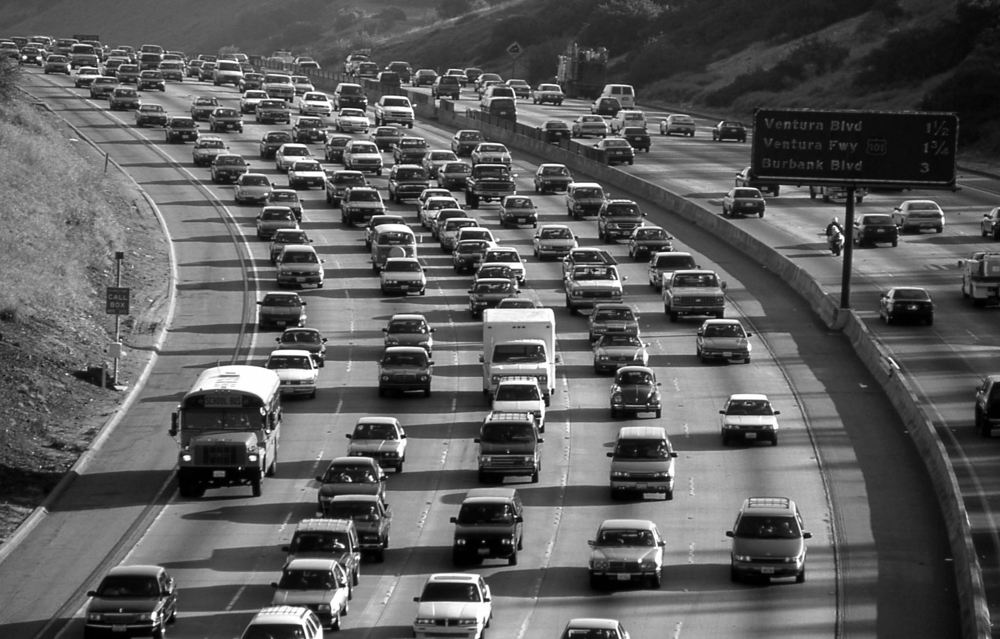

In [ ]:
grey = cv2.cvtColor(image_arr,cv2.COLOR_BGR2GRAY)
Image.fromarray(grey)

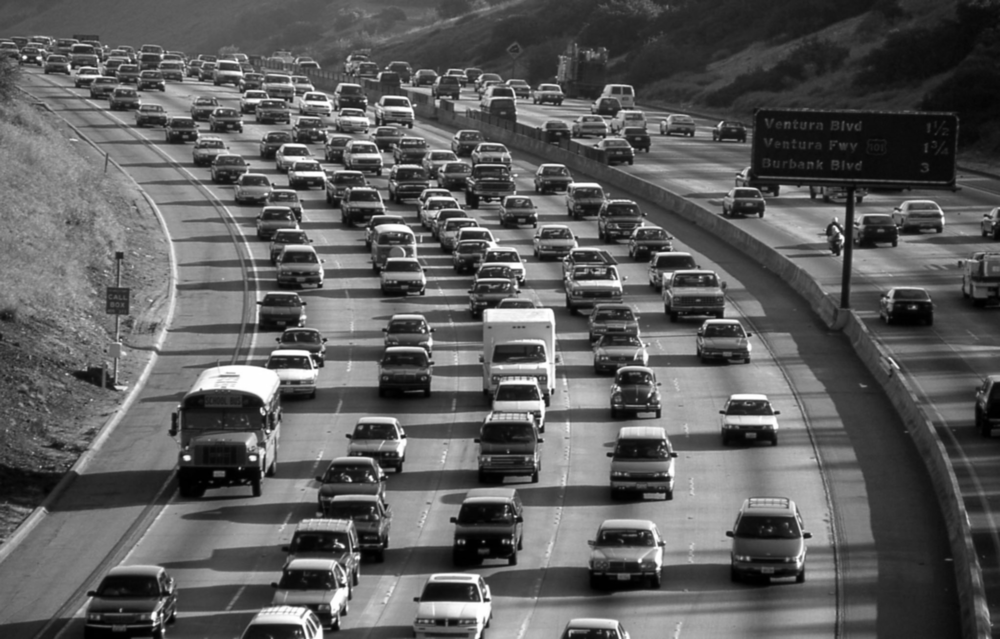

In [ ]:
blur = cv2.GaussianBlur(grey,(5,5),0)
Image.fromarray(blur)

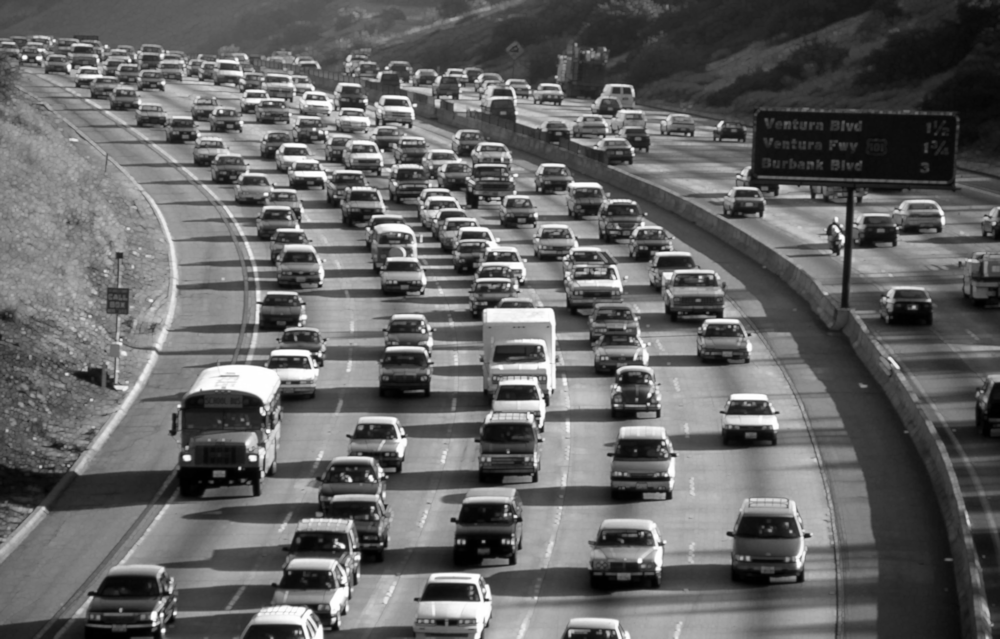

In [ ]:
dilated = cv2.dilate(blur,np.ones((3,3)))
Image.fromarray(dilated)

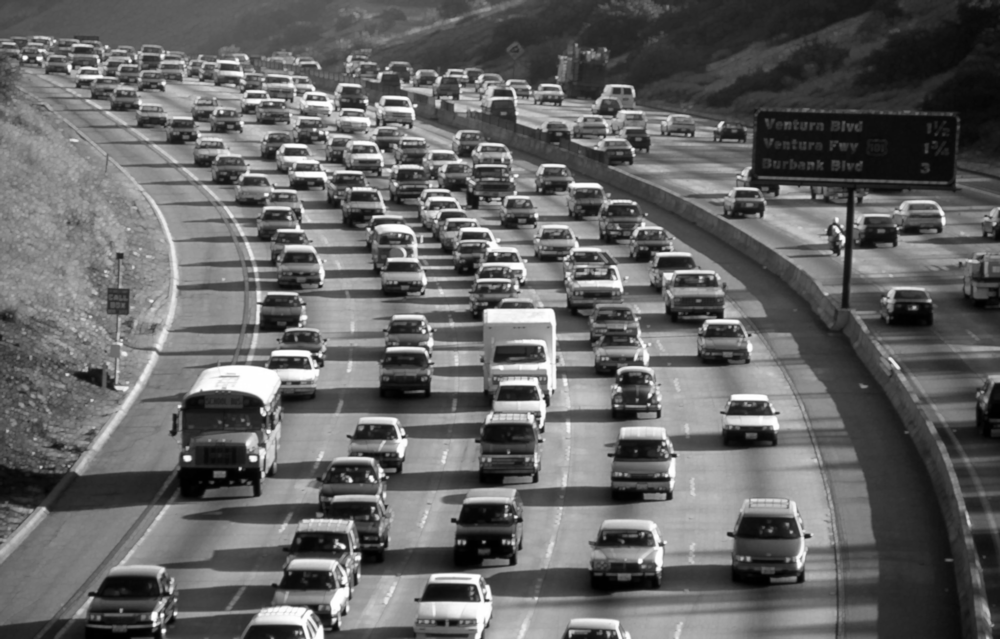

In [ ]:
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(2,2))
closing = cv2.morphologyEx(dilated, cv2.MORPH_CLOSE,kernel)
Image.fromarray(closing)

In [ ]:
#Cascade
car_cascade_src = 'cars.xml'
car_cascade = cv2.CascadeClassifier(car_cascade_src)
cars = car_cascade.detectMultiScale(grey, 1.1, 1)

106 Cars found


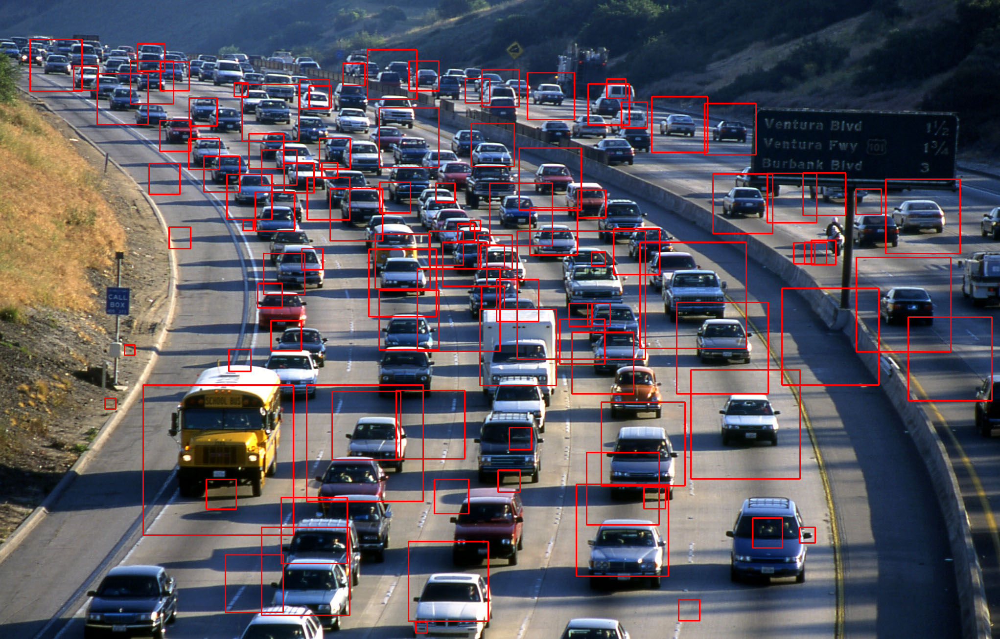

In [ ]:
cnt = 0
for (x,y,w,h) in cars:
	cv2.rectangle(image_arr,(x,y),(x+w,y+h),(255,0,0),2)
	cnt += 1
print(cnt, "Cars found")
Image.fromarray(image_arr)

In [ ]:
cascade_src = 'cars.xml'
video_src = 'Cars.mp4'

cap = cv2.VideoCapture(video_src)
car_cascade = cv2.CascadeClassifier(cascade_src)
video = cv2.VideoWriter('result.mp4', cv2.VideoWriter_fourcc(*'DIVX'),15,(450,250))

In [ ]:
while True:
  ret, img = cap.read()
  if(type(img)==type(None)):
    break
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  cars = car_cascade.detectMultiScale(gray,1.1,2)

  for (x,y,w,h) in cars :
    cv2.rectangle(image_arr,(x,y),(x+w,y+h),(255,0,0),2)
    video.write(img)
video.release()